In [1]:
%matplotlib inline
# Load packages and settings
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.min_rows', 50)

pd.options.mode.chained_assignment = None  # default='warn'

import seaborn as sns
import datetime



from matplotlib.patches import Patch
from matplotlib.lines import Line2D

from random import randint

import sys
sys.path.append("./../scripts")
import PandemiXFunctions as pf

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12,8)
plt.rcParams['figure.facecolor'] = (1,1,1,1)
plt.rcParams["image.cmap"] = "tab10"
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.tab10.colors)
fs_label = 16
parameters = {
                'axes.labelsize': fs_label,
                'axes.titlesize': fs_label+4,
                'xtick.labelsize': fs_label,
                'ytick.labelsize': fs_label, 
                'legend.fontsize': fs_label, 
                'lines.markersize': 10,
                'lines.linewidth': 3
             }
plt.rcParams.update(parameters)
from matplotlib import cm # Colormaps
import matplotlib.colors as colors
# cmap = plt.cm.get_cmap('Dark2',len(ageGroups))

import locale
import matplotlib.dates as mdates
locale.setlocale(locale.LC_TIME,"Danish")
# ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
# ax1.spines['top'].set_visible(False) 

import os
# import csv
import math

from datetime import date


saveFigures = False

print('saveFigures is set to: '+str(saveFigures))

print('Done loading packages')

saveFigures is set to: False
Done loading packages


In [2]:
# Define paths
rootdir_data = os.getcwd() +"/../WHO/" 
path_figs = os.getcwd() +"/../Figures/"

# Save filenames
by_country_file = rootdir_data+"WHO_COVID_Excess_Deaths_EstimatesByCountry.xlsx"
by_income_file = rootdir_data+"WHO_COVID_Excess_Deaths_EstimatesByIncome.xlsx"
by_region_file = rootdir_data+"WHO_COVID_Excess_Deaths_EstimatesByRegion.xlsx"

In [3]:
#Read xlsx files to df

### There may be some NaN rows in in the tail of the dataframe due to notes in the excel files.

### For Country
df_cont_time = pd.read_excel(by_country_file, sheet_name="Country by year and month", header=12)
df_cont_age_sex = pd.read_excel(by_country_file, sheet_name="Country by year, sex and age", header=11)
df_cont_rate = pd.read_excel(by_country_file, sheet_name="Country rate by year", header=8)

### For Income
df_income_time = pd.read_excel(by_income_file, sheet_name="Deaths by year and month", header=11)
df_income_age_sex = pd.read_excel(by_income_file, sheet_name="Deaths by year, sex and age", header=10)

### For Region
df_region_time = pd.read_excel(by_region_file, sheet_name="Region by year and month", header=11) 
df_region_age_sex = pd.read_excel(by_region_file, sheet_name="Region by year, sex and age", header=10) 

In [4]:
df = df_cont_age_sex.dropna()
list_of_countrys = df["country"].unique()

In [5]:
# Choose country
loc = "Denmark"
df_loc = df.loc[df["country"] == loc]

In [33]:
# Sort data and sum excess between sex
###!!! practice usign df.pivot_table() instead!!!
def mean_excess_fun(loc, colum="country"):

    df_loc = df.loc[df[colum] == loc]

    df_loc_2020 = df_loc.loc[df_loc["year"] == 2020]
    df_loc_2020_Male = df_loc_2020.loc[df_loc_2020["sex"] == "Male"].set_index("age")
    df_loc_2020_Female = df_loc_2020.loc[df_loc_2020["sex"] == "Female"].set_index("age")

    excess_mean_2020 = df_loc_2020_Male["excess.mean"]+df_loc_2020_Female["excess.mean"]

    df_loc_2021 = df_loc.loc[df_loc["year"] == 2021]
    df_loc_2021_Male = df_loc_2021.loc[df_loc_2021["sex"] == "Male"].set_index("age")
    df_loc_2021_Female = df_loc_2021.loc[df_loc_2021["sex"] == "Female"].set_index("age")

    excess_mean_2021 = df_loc_2021_Male["excess.mean"]+df_loc_2021_Female["excess.mean"]
    
    return excess_mean_2020, excess_mean_2021

In [7]:
mean_list_0 = []
mean_list_1 = []
for loc in list_of_countrys:
    mean_2020, mean_2021 = mean_excess_fun(loc)
    mean_list_0.append(mean_2020.sum())
    mean_list_1.append(mean_2021.sum())
list_of_countrys_sorted = pd.DataFrame({
    "contry": list_of_countrys,
    "mean_2020": mean_list_0,
    "mean_2021": mean_list_1
    })
list_of_countrys_sorted_0 = list_of_countrys_sorted.sort_values("mean_2020")
list_of_countrys_sorted_0 = list(list_of_countrys_sorted_0["contry"])

list_of_countrys_sorted_1 = list_of_countrys_sorted.sort_values("mean_2021")
list_of_countrys_sorted_1 = list(list_of_countrys_sorted_1["contry"])

In [8]:
# Make graph

for loc in list_of_countrys:
    
    excess_mean_2020, excess_mean_2021 = mean_excess_fun(loc)
    
    labels = excess_mean_2021.index

    x = np.arange(len(labels))  # the label locations
    width = 0.4  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, excess_mean_2020, width, label='2020')
    rects2 = ax.bar(x + width/2, excess_mean_2021, width, label='2021')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('mean excess mortallity')
    ax.set_title(f'{loc} mean excess mortallity\n in 2020 and 2021')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.axhline(0,color='k',lw=1)
    ax.legend()
    if saveFigures:
        plt.savefig(path_figs+f"WHO age excess/{loc} mean excess ages", bbox_inches = 'tight')
    plt.clf()

C:\Users\manno\AppData\Local\Temp/ipykernel_14624/3227283325.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

<Figure size 864x576 with 0 Axes>

In [9]:
# loc = "Denmark"
# data = mean_excess_fun(loc)[0]
# data = data.sort_values()

# # Take negative and positive data apart and cumulate
# def get_cumulated_array(data, **kwargs):
#     cum = data.clip(**kwargs)
#     cum = cum.cumsum()
#     d = pd.Series(np.zeros(np.shape(data)),index=data.index)
#     d[1:] = cum[:-1]
#     return d  

# cum_data_pos = get_cumulated_array(data, lower=0)
# cum_data_neg = get_cumulated_array(data, upper=0)
# row_mask = (data<0)
# cum_data_pos[row_mask] = cum_data_neg[row_mask]

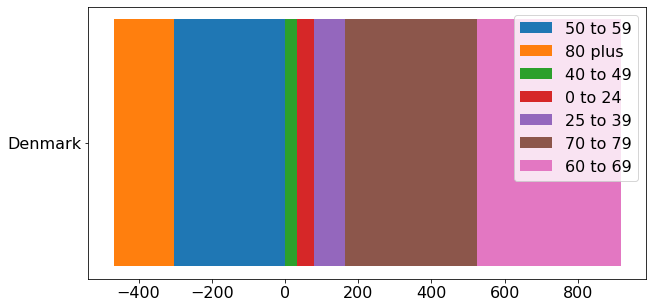

In [10]:
# fig, ax = plt.subplots(figsize=(10, 5))
# for i in range(len(data)):
#     ax.barh(loc,data.iloc[i],left=cum_data_pos[i],label=data.index[i])
# ax.legend()

In [11]:
#To make color coding of ages consistant
n = len(data.index)
color_list = ['#%06X' % randint(0, 0xFFFFFF) for i in range(n)]
color_list = ["Green","Blue","Yellow","Orange","Pink","Red","Grey"]

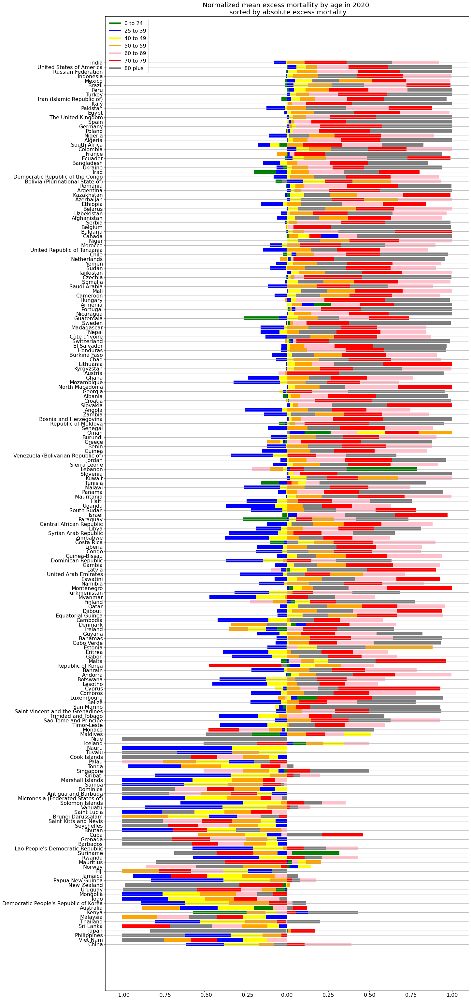

In [22]:

fig, ax = plt.subplots(figsize=(20, 55))

for loc in list_of_countrys_sorted_0:
    data = mean_excess_fun(loc)[0]
    df_agebars = pd.Series.to_frame(data)
    df_agebars["color"] = color_list
    df_agebars["norm_data"] = df_agebars["excess.mean"].divide(abs(df_agebars["excess.mean"]).sum())
    df_agebars["abs_data"] = abs(df_agebars["excess.mean"])
    df_agebars = df_agebars.sort_values("abs_data")
    
    # Take negative and positive data apart and cumulate
    def get_cumulated_array(data, **kwargs):
        cum = data.clip(**kwargs)
        cum = cum.cumsum()
        d = pd.Series(np.zeros(np.shape(data)),index=df_agebars.index)
        d[1:] = cum[:-1]
        return d  

    cum_data_pos = get_cumulated_array(df_agebars["norm_data"], lower=0)
    cum_data_neg = get_cumulated_array(df_agebars["norm_data"], upper=0)
    row_mask = (df_agebars["norm_data"]<0)
    cum_data_pos[row_mask] = cum_data_neg[row_mask]
    df_agebars["cum_data_pos"] = cum_data_pos

    # for i in range(len(data)):
    #     ax.barh(loc,df_agebars["norm_data"].iloc[i], left=cum_data_pos[i], color=df_agebars["color"][i]) #Problem! Den giver farve efter den sorterede orden ikke efter aldersgruppen!
        #Evt loop over alderstruppe navne istedet for index?
    for i in list(df_agebars.index):
        ax.barh(loc,df_agebars["norm_data"].loc[i], left=df_agebars["cum_data_pos"].loc[i], color=df_agebars["color"].loc[i])
data = mean_excess_fun(loc)[1]

# custom_lines = [Line2D([0], [0], color=cmap(0.), lw=4),
#                 Line2D([0], [0], color=cmap(.5), lw=4),
#                 Line2D([0], [0], color=cmap(1.), lw=4)]
custom_lines = [Line2D([0], [0], color=i, lw= 4) for i in color_list]
ax.legend(custom_lines, list(data.index))
ax.set_title("Normalized mean excess mortallity by age in 2020 \n sorted by absolute excess mortality")
ax.axvline(0,color='k',linestyle='--',linewidth=1)
ax.grid(axis='y')
if saveFigures:
    plt.savefig(path_figs+f"Normalized mean excess mortallity, by age in 2020", bbox_inches = 'tight')
    

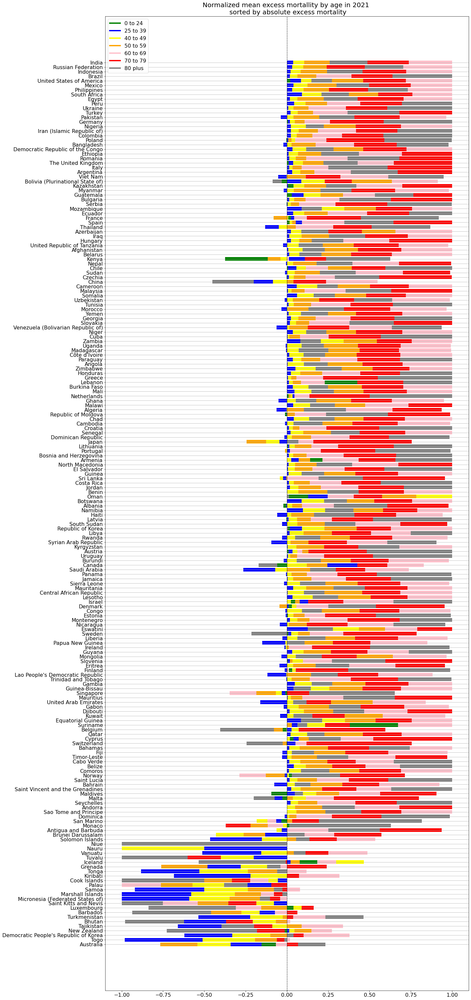

In [23]:

fig, ax = plt.subplots(figsize=(20, 55))

for loc in list_of_countrys_sorted_1:
    data = mean_excess_fun(loc)[1]
    df_agebars = pd.Series.to_frame(data)
    df_agebars["color"] = color_list
    df_agebars["norm_data"] = df_agebars["excess.mean"].divide(abs(df_agebars["excess.mean"]).sum())
    df_agebars["abs_data"] = abs(df_agebars["excess.mean"])
    df_agebars = df_agebars.sort_values("abs_data")
    
    # Take negative and positive data apart and cumulate
    def get_cumulated_array(data, **kwargs):
        cum = data.clip(**kwargs)
        cum = cum.cumsum()
        d = pd.Series(np.zeros(np.shape(data)),index=df_agebars.index)
        d[1:] = cum[:-1]
        return d  

    cum_data_pos = get_cumulated_array(df_agebars["norm_data"], lower=0)
    cum_data_neg = get_cumulated_array(df_agebars["norm_data"], upper=0)
    row_mask = (df_agebars["norm_data"]<0)
    cum_data_pos[row_mask] = cum_data_neg[row_mask]
    df_agebars["cum_data_pos"] = cum_data_pos

    # for i in range(len(data)):
    #     ax.barh(loc,df_agebars["norm_data"].iloc[i], left=cum_data_pos[i], color=df_agebars["color"][i]) #Problem! Den giver farve efter den sorterede orden ikke efter aldersgruppen!
        #Evt loop over alderstruppe navne istedet for index?
    for i in list(df_agebars.index):
        ax.barh(loc,df_agebars["norm_data"].loc[i], left=df_agebars["cum_data_pos"].loc[i], color=df_agebars["color"].loc[i])
data = mean_excess_fun(loc)[1]

# custom_lines = [Line2D([0], [0], color=cmap(0.), lw=4),
#                 Line2D([0], [0], color=cmap(.5), lw=4),
#                 Line2D([0], [0], color=cmap(1.), lw=4)]
custom_lines = [Line2D([0], [0], color=i, lw= 4) for i in color_list]
ax.legend(custom_lines, list(data.index))
ax.set_title("Normalized mean excess mortallity by age in 2021 \n sorted by absolute excess mortality")
ax.axvline(0,color='k',linestyle='--',linewidth=1)
ax.grid(axis='y')
if saveFigures:
    plt.savefig(path_figs+f"Normalized mean excess mortallity, by age in 2021", bbox_inches = 'tight')

In [24]:
### Test redundat now
# loc = "Norway"
# data = mean_excess_fun(loc)[1]
# df_agebars = pd.Series.to_frame(data)
# df_agebars["color"] = color_list
# df_agebars["norm_data"] = df_agebars["excess.mean"].divide(abs(df_agebars["excess.mean"]).sum())
# df_agebars["abs_data"] = abs(df_agebars["excess.mean"])
# df_agebars = df_agebars.sort_values("abs_data")
# print(df_agebars)

# cum_data_pos = get_cumulated_array(df_agebars["norm_data"], lower=0)
# cum_data_neg = get_cumulated_array(df_agebars["norm_data"], upper=0)
# row_mask = (df_agebars["norm_data"]<0)
# cum_data_pos[row_mask] = cum_data_neg[row_mask]
# df_agebars["cum_data_pos"] = cum_data_pos
# fig, ax = plt.subplots(figsize=(15, 5))
# # for i in range(len(data)):
# #     ax.barh(loc,df_agebars["norm_data"].iloc[i], left=cum_data_pos[i], color=df_agebars["color"][i]) #Problem! Den giver farve efter den sorterede orden ikke efter aldersgruppen!
#     #Evt loop over alderstruppe navne istedet for index?
# for i in list(df_agebars.index):
#     ax.barh(loc,df_agebars["norm_data"].loc[i], left=df_agebars["cum_data_pos"].loc[i], color=df_agebars["color"].loc[i])
# ax.legend(list(df_agebars.index))
# ax.axvline(0,color='k',linestyle='--',linewidth=1)
# plt.show()

## Compare excess for OWiD with WHO 

In [25]:
df_owid = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")
df_owid['date'] =  pd.to_datetime(df_owid['date'], format='%Y-%m-%d')

df_eco = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/excess_mortality/excess_mortality_economist_estimates.csv')
df_eco['date'] =  pd.to_datetime(df_eco['date'], format='%Y-%m-%d')

In [26]:
# df.loc[df["location"] == location]
def time_slice(df, start, end):
    mask = (df['date'] > start) & (df['date'] <= end)
    return df.loc[mask]

In [27]:
# GHXD data downloaded from https://ghdx.healthdata.org/record/ihme-data/covid_19_excess_mortality
df_GHXD = pd.read_csv(os.getcwd() +"/../location_specific_excess_GHDX.csv", encoding=" ISO-8859-1")

In [28]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3
owid_loc = df_owid["location"].unique()
eco_loc = df_eco["country"].unique()
GHXD_loc = df_GHXD['location_name'].unique()
list_of_loc = intersection(owid_loc,eco_loc)
list_of_loc = intersection(list_of_loc,GHXD_loc)

C:\Users\manno\AppData\Local\Temp/ipykernel_14624/726894964.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(1,figsize=(15,8), sharey=True)


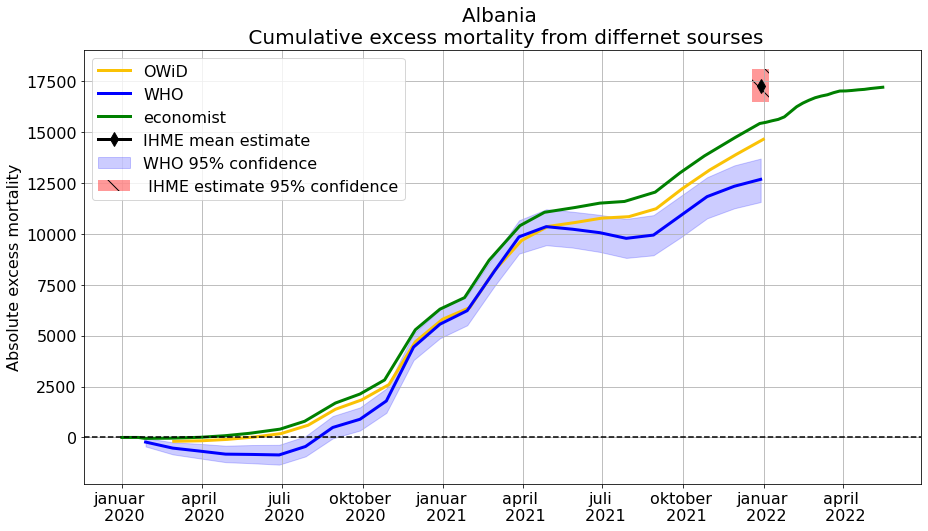

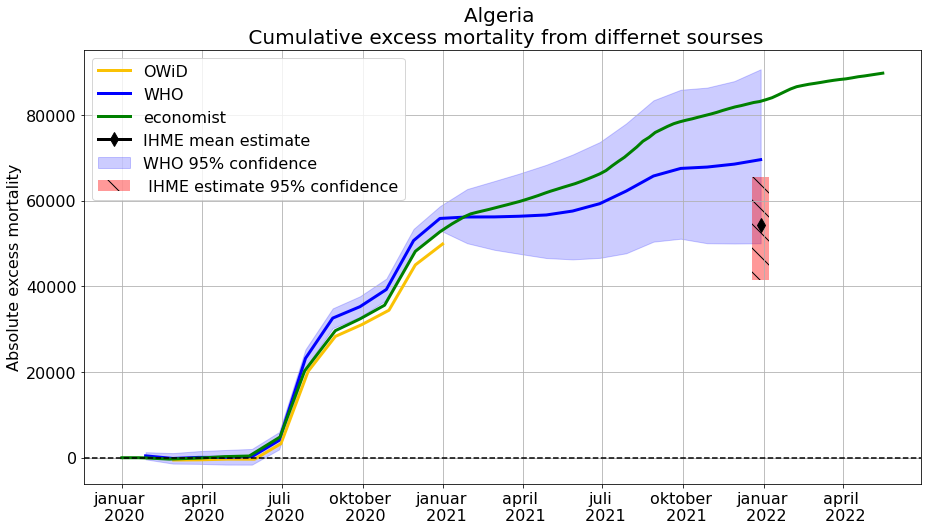

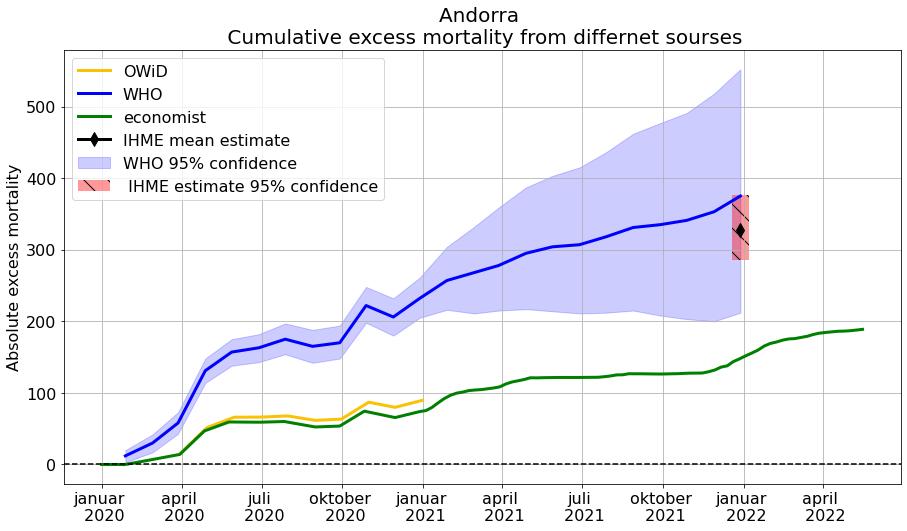

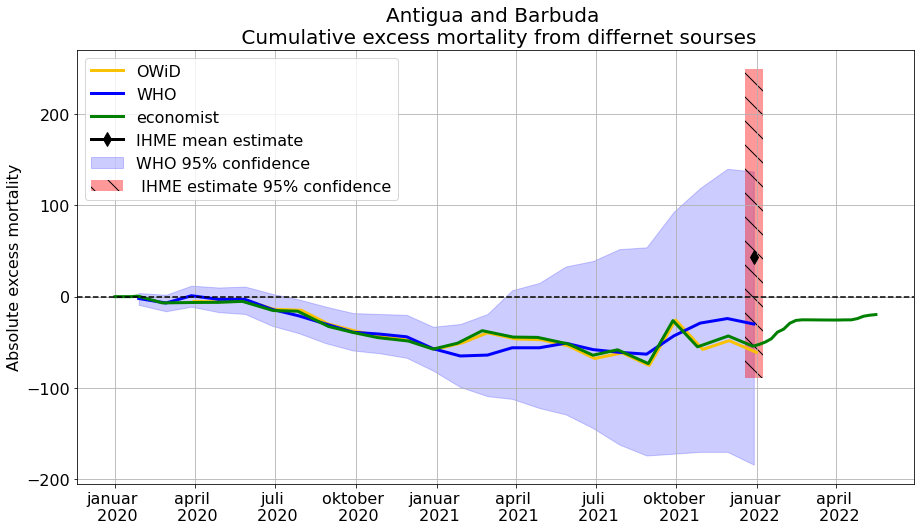

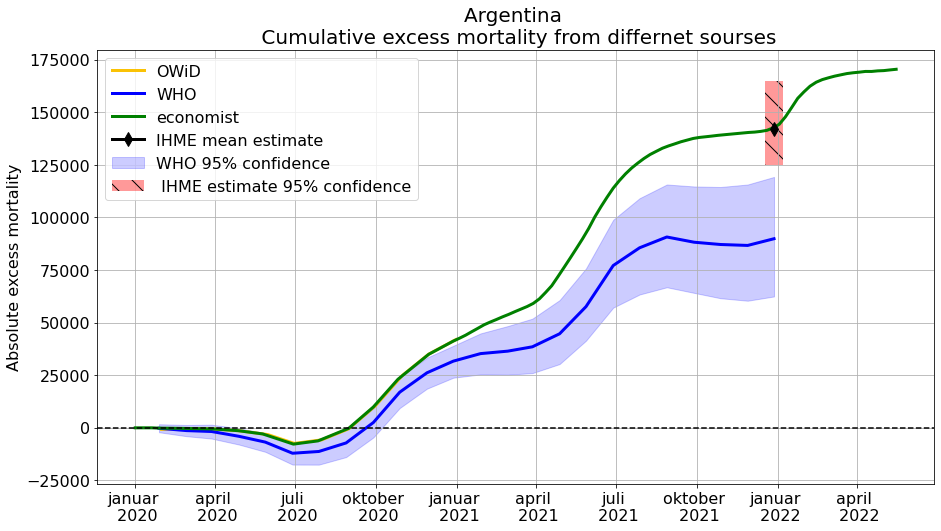

...

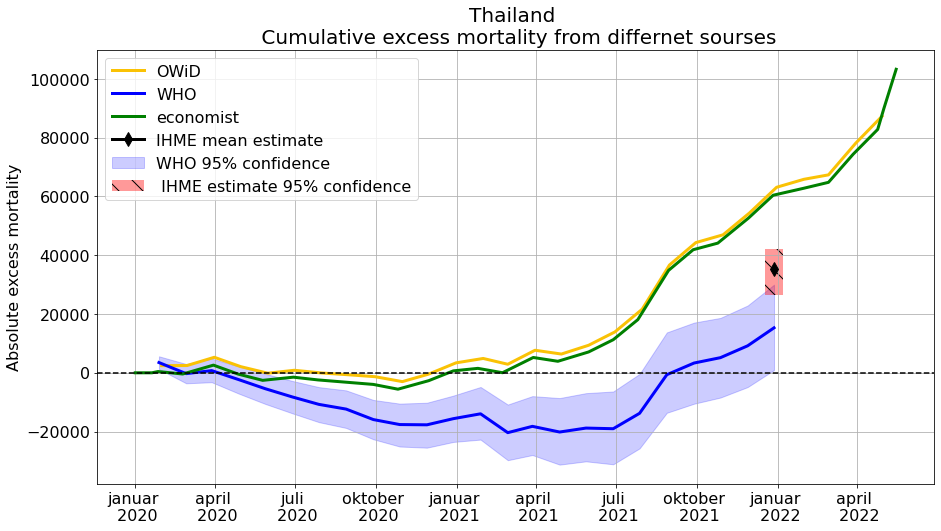

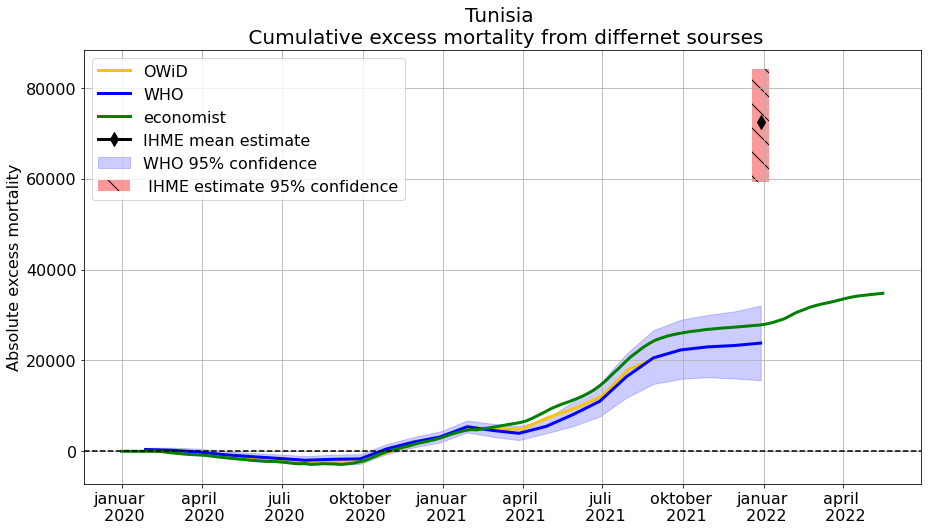

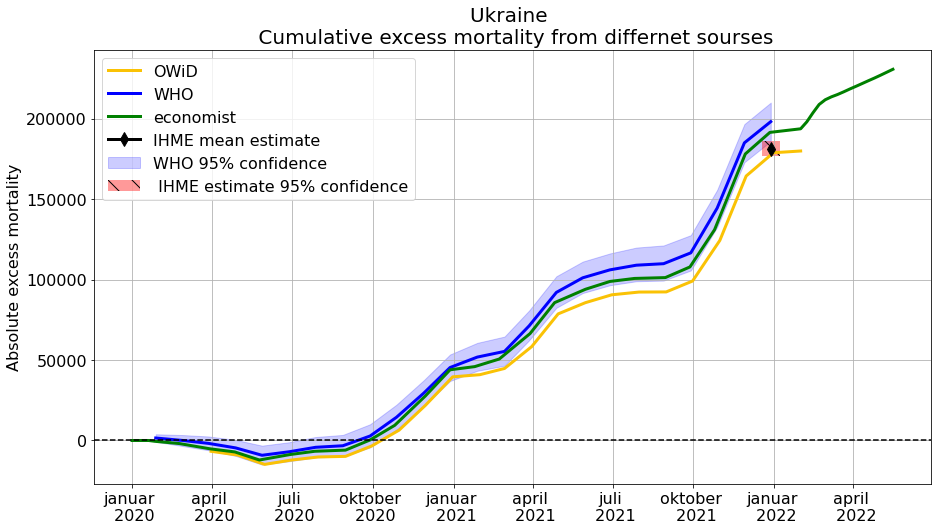

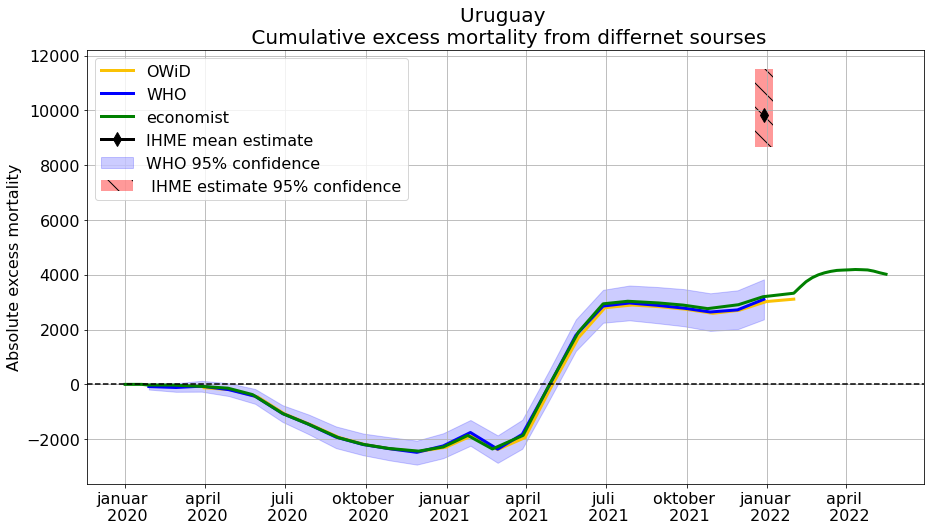

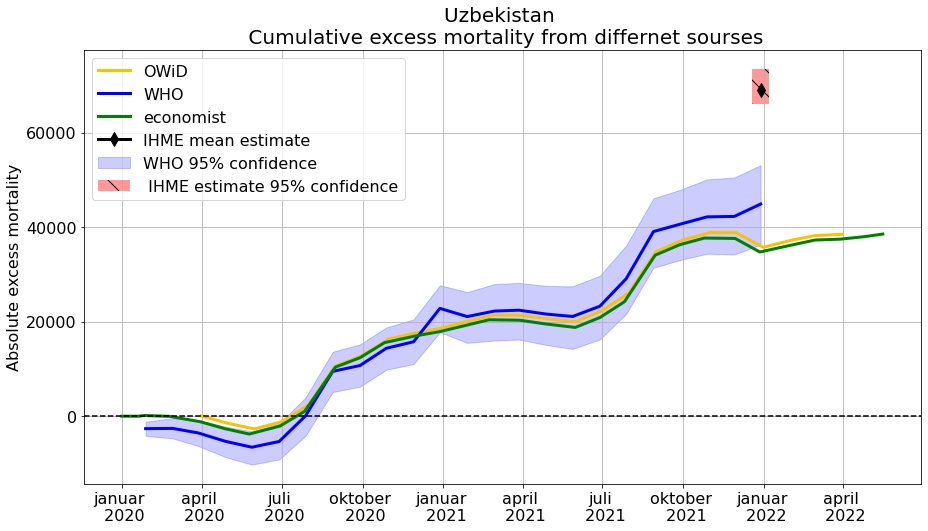

In [29]:
for loc in list_of_loc:
    
    df_mask_1 = df_GHXD[df_GHXD['location_name']==loc]
    df_mask_2 = df_mask_1[df_mask_1['measure_name'] == "excess_deaths"]
    
    df_owid_loc = df_owid.loc[df_owid["location"] == loc]
    df_eco_loc = df_eco.loc[df_eco['country'] == loc]
    df_who_loc = df_cont_time.loc[df_cont_time["country"] == loc]
    
    df_who_loc['date'] = df_who_loc['year']*10000+df_who_loc['month']*100+28 
    df_who_loc['date'] = pd.to_datetime(df_who_loc['date'], format='%Y%m%d')

    
    num1 = len(df_owid_loc['date'])
    num2 = len(df_eco_loc['date'])
    num3 = len(df_who_loc['date'])

    if (num1 <= num2) and (num1 <= num3):
       smallest = num1
    elif (num2 <= num1) and (num2 <= num3):
       smallest = num2
    else:
       smallest = num3
    
    if smallest>10:
        low = df_mask_2["lower_ci"].iloc[0]
        mean = df_mask_2["mean_value"].iloc[0]
        high = df_mask_2["upper_ci"].iloc[0]
    #     df_who_loc['date'] = df_who_loc['year']*100+df_who_loc['month'] 
    #     df_who_loc['date'] = pd.to_datetime(df_who_loc['date'], format='%Y%m')

        #Find latest data point in dfs
        num1 = df_owid_loc['date'].iloc[0]
        num2 = df_eco_loc['date'].iloc[0]
        num3 = df_who_loc['date'].iloc[0]

        if (num1 >= num2) and (num1 >= num3):
           latest = num1
        elif (num2 >= num1) and (num2 >= num3):
           latest = num2
        else:
           latest = num3

        num1 = df_owid_loc['date'].iloc[-1]
        num2 = df_eco_loc['date'].iloc[-1]
        num3 = df_who_loc['date'].iloc[-1]

        if (num1 <= num2) and (num1 <= num3):
           last = num1
        elif (num2 <= num1) and (num2 <= num3):
           last = num2
        else:
           last = num3


        #Slice data between latest and last
    #     df_who_loc = time_slice(df_who_loc,latest,last)
    #     df_eco_loc = time_slice(df_eco_loc,latest,last)
    #     df_owid_loc = time_slice(df_owid_loc,latest,last)

        # #Removes nans
        df_owid_loc = df_owid_loc[df_owid_loc['excess_mortality_cumulative_absolute'].notna()]
        df_who_loc = df_who_loc[df_who_loc["cumul.excess.mean"].notna()]
        df_eco_loc = df_eco_loc[df_eco_loc["cumulative_estimated_daily_excess_deaths"].notna()]

        # Find differences
        # df_merged_we = df_who_loc.merge(df_eco_loc,how='left',on='date')
        # df_merged_we['diff'] = df_merged_we["cumul.excess.mean"]-df_merged_we["cumulative_estimated_daily_excess_deaths"]

        # df_merged_we = df_merged_we[df_merged_we['diff'].notna()]

        # df_merged_wo = df_who_loc.merge(df_owid_loc,how='left',on='date')
        # df_merged_wo['diff'] = df_merged_wo["cumul.excess.mean"]-df_merged_wo['excess_mortality_cumulative_absolute']

        # df_merged_wo = df_merged_wo[df_merged_wo['diff'].notna()]
        if len(df_owid_loc['date'])>0:
            ### Make Figure:
            fig, ax1 = plt.subplots(1,figsize=(15,8), sharey=True)
            #ax1
            ax1.plot(df_owid_loc['date'],df_owid_loc['excess_mortality_cumulative_absolute'], color='#fac205',label="OWiD", linestyle='-')
            ax1.plot(df_who_loc['date'],df_who_loc["cumul.excess.mean"],label="WHO",color='blue', linestyle='-')
            ax1.fill_between(df_who_loc['date'], df_who_loc['cumul.excess.low'], df_who_loc['cumul.excess.high'], color='b', alpha=.2, label="WHO 95% confidence")
            ax1.plot(df_eco_loc['date'],df_eco_loc['cumulative_estimated_daily_excess_deaths'], color='green', label="economist", linestyle='-')
            ax1.axhline(0,color='k',linestyle='--', linewidth=1.5)

            #IHME estimates
            # ax1.plot((df_owid_loc['date'].iloc[0],df_owid_loc['date'].iloc[-1]),(mean,mean),color='g', linestyle='-.', label='IHME excess mean estimat')
            # ax1.fill_between(df_owid_loc['date'], low, high, color='g', alpha=.2, label=" IHME estimate 95% confidence")
            ax1.bar(df_who_loc['date'].iloc[-1], high-low, width=20, hatch="\\",color='r',alpha=0.4, bottom=low,label=" IHME estimate 95% confidence")
            ax1.plot(df_who_loc['date'].iloc[-1],mean,color='k', marker="d", label="IHME mean estimate")
            #ax1.errorbar(df_who_loc['date'].iloc[-1], mean, np.array([[low], [high]]),fmt='rs' ,label=" IHME estimate 95% confidence")
            #ax1.bar(df_who_loc['date'].iloc[-1], 50, width=50, color='k', bottom=mean-50,label='IHME excess mean estimat')
            ax1.grid()
            ax1.legend(loc='upper left')
            ax1.xaxis.set_major_formatter(mdates.DateFormatter('%B \n %Y'))
            ax1.set_title(f"{loc} \n Cumulative excess mortality from differnet sourses")
            ax1.set_ylabel("Absolute excess mortality")
            #ax1.text(df_who_loc['date'].iloc[-3], mean, f'high:{high}\n mean:{mean}\n low: {low}', fontsize = 12)
            if saveFigures:
                plt.savefig(path_figs+f"/WHO excess comparisons/{loc} WHO vs OWiD excess mortallity", bbox_inches = 'tight')

## Income vs age 

In [30]:
df_income_age_sex

,income,year,sex,age,Nx,type,expected.mean,acm.mean,excess.mean
0,LIC,2020,Female,0 to 24,203977974,Predicted,852014,852014,0
1,LIC,2020,Female,25 to 39,65843490,Predicted,160914,149176,-11738
2,LIC,2020,Female,40 to 49,26801643,Predicted,139071,139805,734
3,LIC,2020,Female,50 to 59,18136805,Predicted,180251,195088,14837
4,LIC,2020,Female,60 to 69,11261450,Predicted,245556,279865,34309
5,LIC,2020,Female,70 to 79,5813135,Predicted,300020,329099,29079
6,LIC,2020,Female,80 plus,1743203,Predicted,223633,247736,24103
7,LIC,2020,Male,0 to 24,208309683,Predicted,1056490,1056490,0
8,LIC,2020,Male,25 to 39,65386472,Predicted,207103,183745,-23358
9,LIC,2020,Male,40 to 49,25950764,Predicted,181357,180039,-1318


In [249]:
df_income_age_sex
df_income_2020 = df_income_age_sex[df_income_age_sex['year'] == 2020]
df_income_2021 = df_income_age_sex[df_income_age_sex['year'] == 2021]

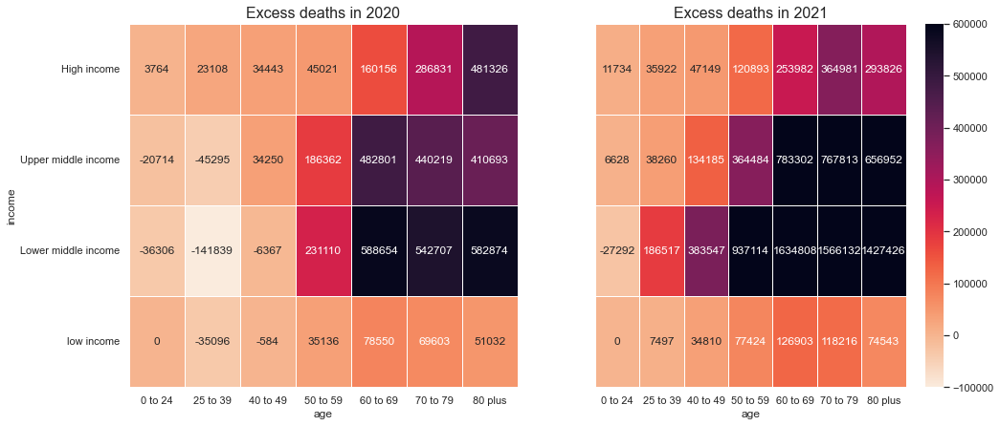

In [314]:
# Draw a heatmap with the numeric values in each cell
f, (ax1,ax2) = plt.subplots(ncols=2,figsize=(16, 7))


A = df_income_2020

# Load the example flights dataset and convert to long-form
A = A.pivot_table(index="income", columns="age", values="excess.mean",aggfunc='sum')

A = A.reindex(['HIC', 'UMIC', 'LMIC', 'LIC'])
A["income"] = (['High income','Upper middle income','Lower middle income','low income'])
A = A.set_index("income", drop=True)

B = df_income_2021

# Load the example flights dataset and convert to long-form
B = B.pivot_table(index="income", columns="age", values="excess.mean",aggfunc='sum')

B = B.reindex(['HIC', 'UMIC', 'LMIC', 'LIC'])
B["income"] = (['High income','Upper middle income','Lower middle income','low income'])
B = B.set_index("income", drop=True)

# Draw a heatmap with the numeric values in each cell
#f, ax = plt.subplots(figsize=(9, 6))

vmax = 600000
vmin = -100000
sns.heatmap(A, annot=True, fmt="d", linewidths=.5, ax=ax1, cmap="rocket_r",cbar=False,vmin=vmin, vmax=vmax)
sns.heatmap(B, annot=True, fmt="d", linewidths=.5, ax=ax2, cmap="rocket_r", yticklabels=False,vmin=vmin, vmax=vmax)
ax2.set_title("Excess deaths in 2021",fontsize=16)
ax2.set_ylabel('')  


ax1.set_title("Excess deaths in 2020",fontsize=16)
if saveFigures:
    plt.savefig(path_figs+f"/WHO excess by age and country income", bbox_inches = 'tight')